In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

If you want to train, validate or run inference on models and don't need to make any modifications to the code, using YOLO command line interface is the easiest way to get started. Read more about CLI in [Ultralytics YOLO Docs](https://v8docs.ultralytics.com/cli/).

```
yolo task=detect    mode=train    model=yolov8n.yaml      args...
          classify       predict        yolov8n-cls.yaml  args...
          segment        val            yolov8n-seg.yaml  args...
                         export         yolov8n.pt        format=onnx  args...
```

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="a7ixfLNh5wtqHUYhxvQf")
project = rf.workspace("cdio-zmfmj").project("retail-product-checkout")
dataset = project.version(35).download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.9 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing in

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Retail-Product-Checkout-35 in yolov8:: 100%|██████████| 6124/6124 [00:01<00:00, 4888.65it/s]


In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8n.pt data={dataset.location}/data.yaml epochs=75 imgsz=640 plots=True patience=100

/content
100% 6.23M/6.23M [00:00<00:00, 160MB/s]
New https://pypi.org/project/ultralytics/8.1.16 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/Retail-Product-Checkout-35/data.yaml, epochs=75, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_strid

In [ ]:
!ls {HOME}/runs/detect/train/

args.yaml					    PR_curve.png	  train_batch1.jpg
confusion_matrix_normalized.png			    R_curve.png		  train_batch2.jpg
confusion_matrix.png				    results.csv		  val_batch0_labels.jpg
events.out.tfevents.1708432462.0c7711b54f5a.1423.0  results.png		  val_batch0_pred.jpg
F1_curve.png					    train_batch0.jpg	  val_batch1_labels.jpg
labels_correlogram.jpg				    train_batch12025.jpg  val_batch1_pred.jpg
labels.jpg					    train_batch12026.jpg  weights
P_curve.png					    train_batch12027.jpg


In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('/content/runs/detect/train/weights/best.pt')
files.download('/content/runs/detect/train/weights/last.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/content


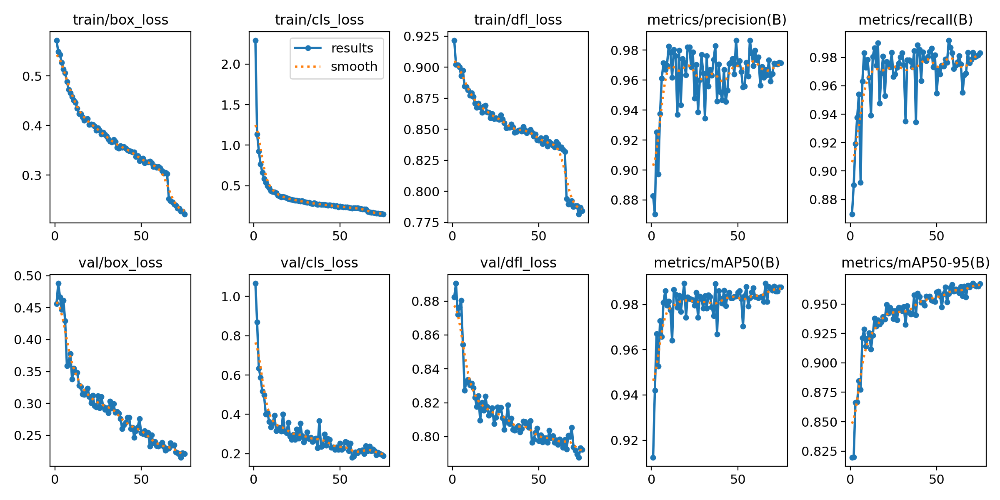

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3007403 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/datasets/Retail-Product-Checkout-35/valid/labels.cache... 50 images, 0 backgrounds, 0 corrupt: 100% 50/50 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 4/4 [00:04<00:00,  1.01s/it]
                   all         50        187      0.971      0.983      0.988      0.969
  4D_medical_face-mask         50         15      0.937      0.994      0.937      0.907
Let-green_alcohol_wipes         50         14      0.987      0.929       0.99      0.972
                 X-men         50         22      0.992          1      0.995      0.984
              aquafina         50         18      0.942          1      0.995      0.908
                  cart         50         34      0.994          1      0.995      0.995
             life-b

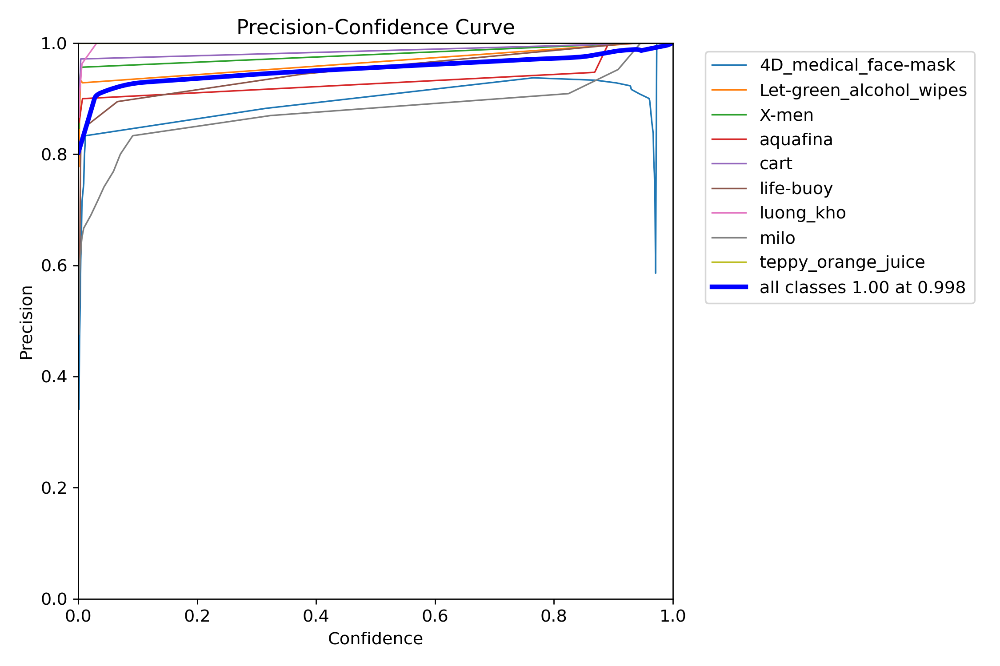

In [ ]:
Image(filename=f'{HOME}/runs/detect/val/P_curve.png', width=600)

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.4 source={dataset.location}/test/images save=True save_txt=True

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3007403 parameters, 0 gradients, 8.1 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/51 /content/datasets/Retail-Product-Checkout-35/test/images/IMG_5962_JPG.rf.661fb79d823022cabe2cecc0fe75e591.jpg: 640x480 2 4D_medical_face-masks, 97.4ms
image 2/51 /content/datasets/Retail-Product-Checkout-35/test/images/IMG_5963_JPG.rf.d3f890941c03e5b0a353a03a64dcc4a0.jpg: 640x480 2 4D_medical_face-masks, 1 cart, 10.7ms
image 3/51 /content/datasets/Retail-Product-Checkout-35/test/images/IMG_5964_JPG.rf.80730cf5d575afb9deb756985662f6b3.jpg: 640x480 2 4D_medical_face-masks, 1 life-buoy, 9.5ms
image 4/51 /content/datasets/Retail-Product-Checkout-35/test/images/IMG_5967_JPG.rf.306d6e7bcd90e1e14b6c3301f644d6b7.jpg: 640x480 1 X-men, 1 life-buoy, 12.3ms
image 5/51 /content/datasets/Retail-Product-Checkout-35/test/images/IMG_5968_JPG.rf.1cb40435f5cf3ce543ce19fd999913cd.jpg: 640

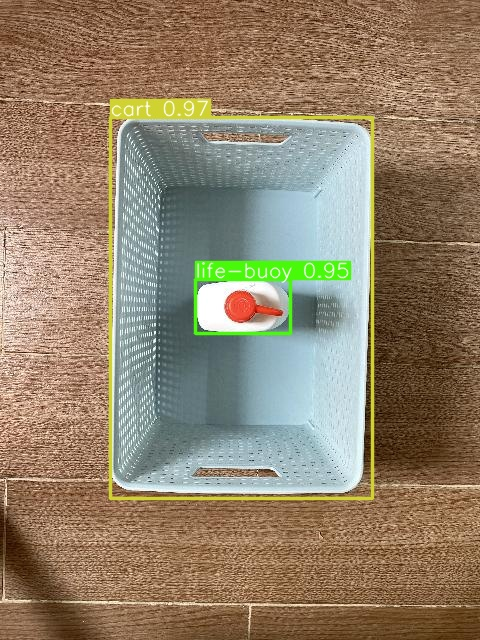

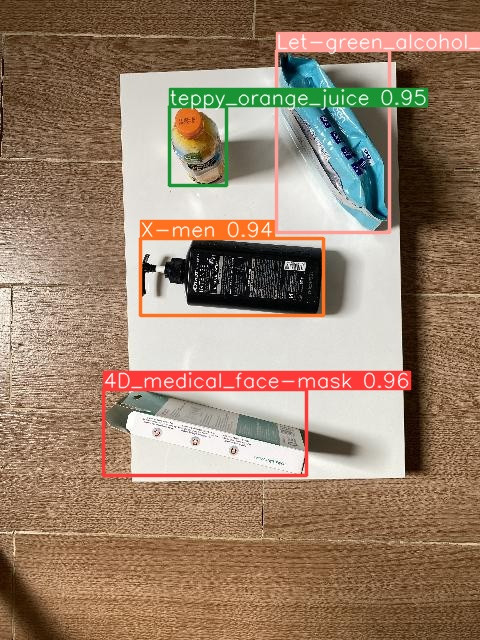

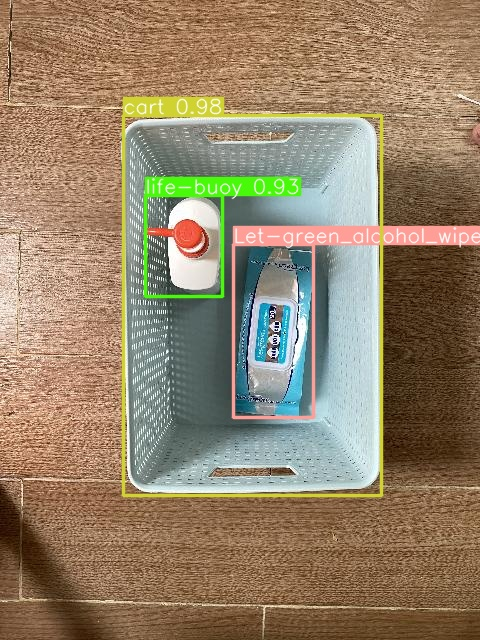

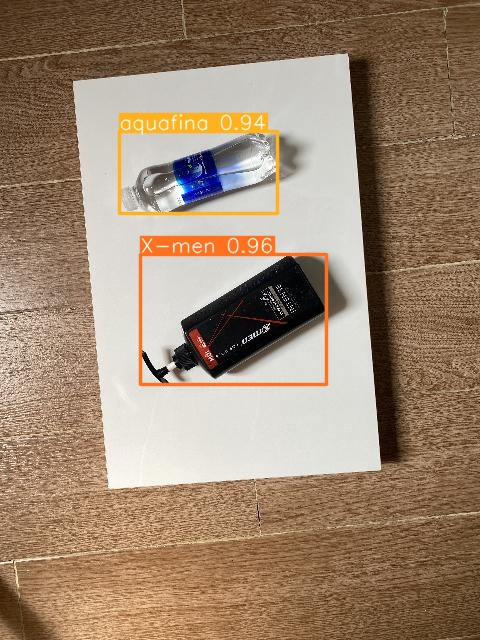

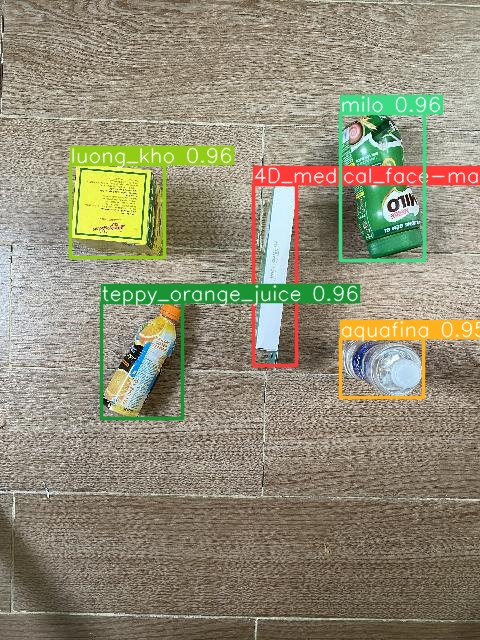

...

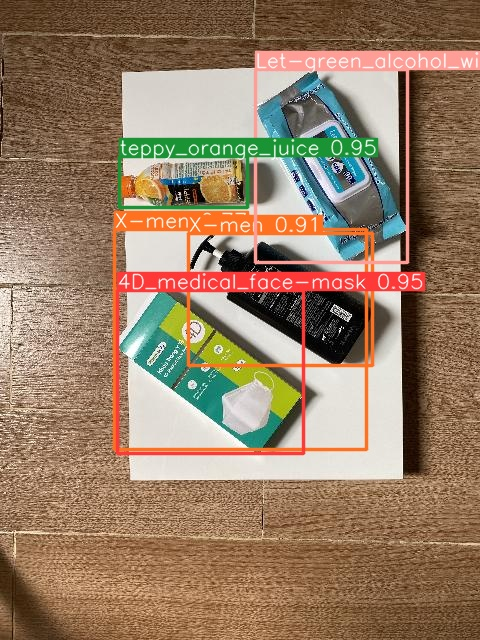

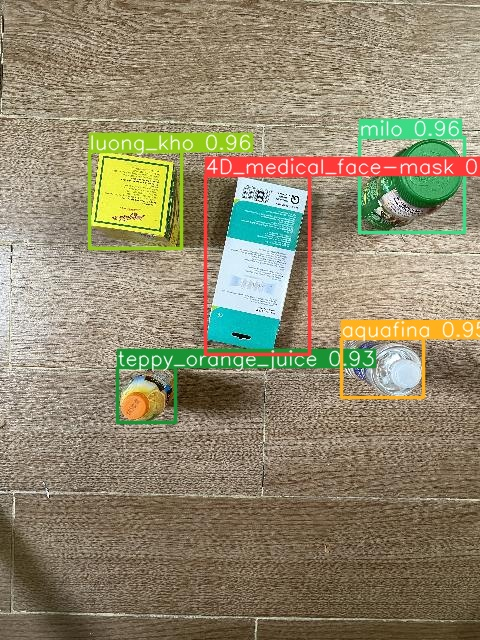

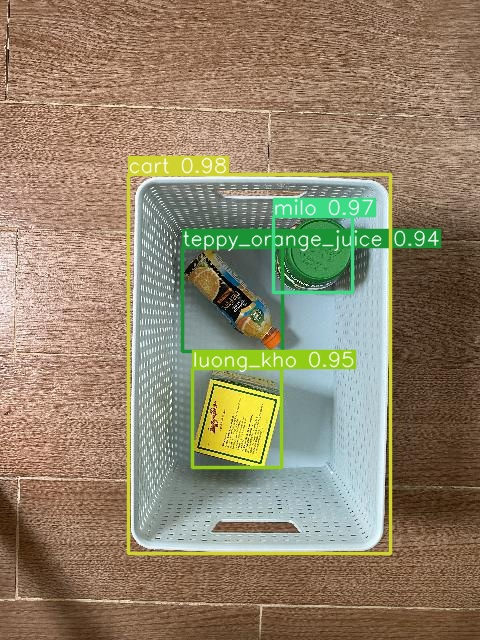

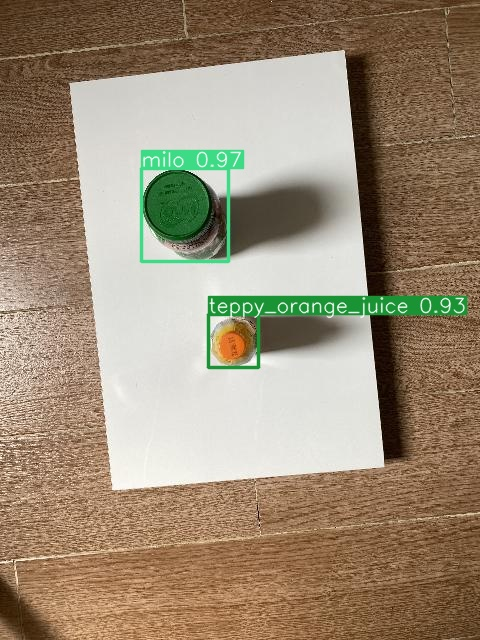

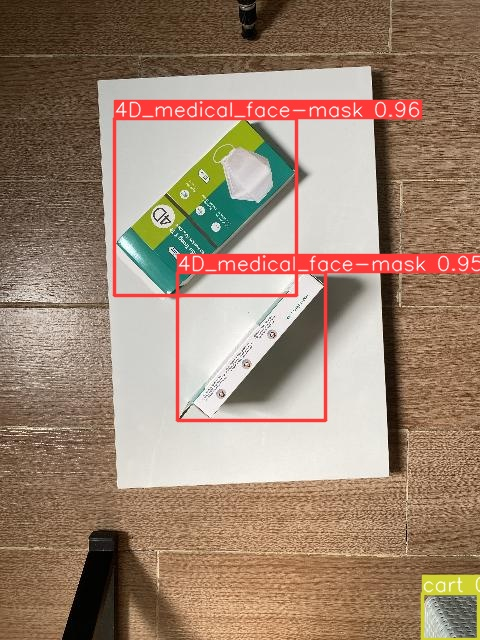

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:
project.version(35).deploy(model_type="yolov8", model_path=f"{HOME}/runs/detect/train/")

View the status of your deployment at: https://app.roboflow.com/cdio-zmfmj/retail-product-checkout/35
Share your model with the world at: https://universe.roboflow.com/cdio-zmfmj/retail-product-checkout/model/35
View the status of your deployment at: https://app.roboflow.com/cdio-zmfmj/retail-product-checkout/35
Share your model with the world at: https://universe.roboflow.com/cdio-zmfmj/retail-product-checkout/model/35
